In [1]:
# """
# You can run either this notebook locally (if you have all the dependencies and a GPU) or on Google Colab.
# TitaNet: https://arxiv.org/pdf/2110.04410.pdf

# Instructions for setting up Colab are as follows:
# 1. Open a new Python 3 notebook.
# 2. Import this notebook from GitHub (File -> Upload Notebook -> "GITHUB" tab -> copy/paste GitHub URL)
# 3. Connect to an instance with a GPU (Runtime -> Change runtime type -> select "GPU" for hardware accelerator)
# 4. Run this cell to set up dependencies.
# """
# # If you're using Google Colab and not running locally, run this cell.

# ## Install dependencies
# !pip install wget
# !apt-get install sox libsndfile1 ffmpeg
# !pip install unidecode

# # ## Install NeMo
# BRANCH = 'main'
# !python -m pip install git+https://github.com/NVIDIA/NeMo.git@$BRANCH#egg=nemo_toolkit[asr]

# ## Install TorchAudio
# !pip install torchaudio -f https://download.pytorch.org/whl/torch_stable.html
import os
print (os.environ['CONDA_DEFAULT_ENV'])

Reading package lists... Done
Building dependency tree       
Reading state information... Done
sox is already the newest version (14.4.2+git20190427-2).
libsndfile1 is already the newest version (1.0.28-7ubuntu0.1).
ffmpeg is already the newest version (7:4.2.7-0ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 2 not upgraded.
  Cloning https://github.com/NVIDIA/NeMo.git (to revision main) to /tmp/pip-install-zldisip4/nemo-toolkit_9a638edc09f049c69c42ed212b99d23c
  Running command git clone --filter=blob:none --quiet https://github.com/NVIDIA/NeMo.git /tmp/pip-install-zldisip4/nemo-toolkit_9a638edc09f049c69c42ed212b99d23c
  Resolved https://github.com/NVIDIA/NeMo.git to commit c9f16fd85b6799e0c35859dd0745fc13340bb2c8
  Preparing metadata (setup.py) ... done


Looking in links: https://download.pytorch.org/whl/torch_stable.html


In [4]:
import os
import wget
from pydub import AudioSegment

ROOT = os.getcwd()
data_dir = os.path.join(ROOT,'data')
os.makedirs(data_dir, exist_ok=True)


audio_uri = '20220405_1746_919580755892_12220504'
audio_file = '20220405_1746_919580755892_12220504.mp3'
audio_file = os.path.join(data_dir, audio_file)
audio_uri = os.path.join(data_dir, audio_uri)

# ami_rttm_file = 'MixHeadset.test.rttm' #  loads a dictionary
# ami_rttm = os.path.join(data_dir, ami_rttm_file)

if not os.path.exists(audio_file):
    print("Check input path file name. No such file in ", os.getcwd())
if audio_file.endswith('.mp3'):
    # convert mp3 file to wav file
    sound = AudioSegment.from_mp3(audio_file)
    audio_file = audio_uri + '.wav'
    sound.export(audio_file, format="wav")    

print("Using audio: "audio_file)
!ls


/tf/SD/NeMo-Nvidia/data/20220405_1746_919580755892_12220504.mp3
 Speaker_Diarization_Inference.ipynb   manifest_vad_input.json	 oracle_vad
 data				      'nemo-audio only.ipynb'	 outputs


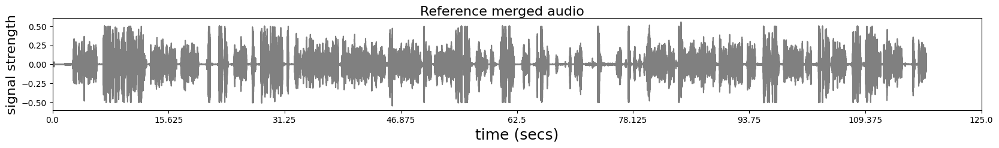

In [6]:
# plot and see the wave
import matplotlib.pyplot as plt
import numpy as np
import librosa

sr = 16000
signal, sr = librosa.load(audio_file,sr=sr) 

# plot and listen to the audio and visualize the RTTM speaker labels
fig,ax = plt.subplots(1,1)
fig.set_figwidth(20)
fig.set_figheight(2)
plt.plot(np.arange(len(signal)),signal,'gray')
fig.suptitle('Reference merged audio', fontsize=16)
plt.xlabel('time (secs)', fontsize=18)
ax.margins(x=0)
plt.ylabel('signal strength', fontsize=16);
a,_ = plt.xticks();plt.xticks(a,a/sr);
plt.show()


We would use [pyannote_metrics](https://pyannote.github.io/pyannote-metrics/) for visualization and score calculation purposes. Hence all the labels in rttm formats would eventually be converted to pyannote objects, we created two helper functions rttm_to_labels (for NeMo intermediate processing) and labels_to_pyannote_object for scoring and visualization format

In [7]:
# TAKES A LOT OF TIME. RUN ONLY FOR VISUALISATION

from IPython import display
display.Audio(audio_file, rate=16000, autoplay=True)

In [8]:
# since for evaluation we use pyannote.metrics, convert rttm formats to pyannote Annotation objects
from nemo.collections.asr.parts.utils.speaker_utils import rttm_to_labels, labels_to_pyannote_object

# view the sample groundtruth rttm file
# !cat {ami_rttm}

[NeMo W 2022-06-28 15:47:47 optimizers:55] Apex was not found. Using the lamb or fused_adam optimizer will error out.


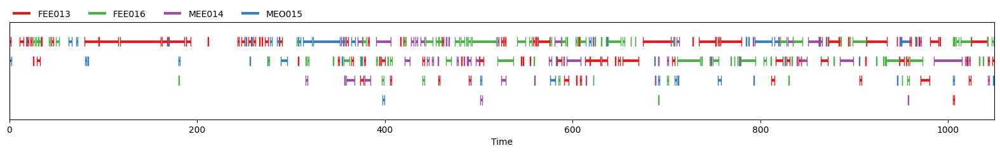

In [8]:
# labels = rttm_to_labels(ami_rttm)
# groundtruth = labels_to_pyannote_object(labels)

# # to see the labels of each speaker and time intervals
# # print(labels)
# groundtruth

Speaker Diarization scripts commonly expects following arguments:
1. manifest_filepath : Path to manifest file containing json lines of format: {'audio_filepath': /path/to/audio_file, 'offset': 0, 'duration':None, 'label': 'infer', 'text': '-', 'num_speakers': None, 'rttm_filepath': /path/to/rttm/file, 'uem_filepath'='/path/to/uem/filepath'}
2. out_dir : directory where outputs and intermediate files are stored. 
3. oracle_vad: If this is true then we extract speech activity labels from rttm files, if False then either 
4. vad.model_path or external_manifestpath containing speech activity labels has to be passed. 

Mandatory fields are audio_filepath, offset, duration, label and text. For the rest if you would like to evaluate with known number of speakers pass the value else None. If you would like to score the system with known rttms then that should be passed as well, else None. uem file is used to score only part of your audio for evaluation purposes, hence pass if you would like to evaluate on it else None.


**Note** we expect audio and corresponding RTTM have **same base name** and the name should be **unique**. 

For eg: if audio file name is **test_an4**.wav, if provided we expect corresponding rttm file name to be **test_an4**.rttm (note the matching **test_an4** base name)


Lets create manifest with the an4 audio and rttm available. If you have more than one files you may also use the script `pathfiles_to_diarize_manifest.py` to generate manifest file from list of audio files and optionally rttm files 

In [9]:
# Create a manifest for input with below format. 
# {'audio_filepath': /path/to/audio_file, 'offset': 0, 'duration':None, 'label': 'infer', 'text': '-', 
# 'num_speakers': None, 'rttm_filepath': /path/to/rttm/file, 'uem_filepath'='/path/to/uem/filepath'}
import json
meta = {
    'audio_filepath': audio_file, 
    'offset': 0, 
    'duration':None, 
    'label': 'infer', 
    'text': '-', 
    'num_speakers': None, 
    'rttm_filepath': None, 
    'uem_filepath' : None
}
with open('data/input_manifest.json','w') as fp:
    json.dump(meta,fp)
    fp.write('\n')

!cat data/input_manifest.json

output_dir = os.path.join(ROOT, 'oracle_vad')
os.makedirs(output_dir,exist_ok=True)

{"audio_filepath": "/tf/SD/NeMo-Nvidia/data/20220405_1746_919580755892_12220504.wav", "offset": 0, "duration": null, "label": "infer", "text": "-", "num_speakers": 2, "rttm_filepath": null, "uem_filepath": null}


# ORACLE-VAD DIARIZATION

Oracle-vad diarization is to compute speaker embeddings from known speech label timestamps rather than depending on VAD output. This step can also be used to run speaker diarization with rttms generated from any external VAD, not just VAD model from NeMo.

For it, the first step is to start converting reference audio rttm(vad) time stamps to oracle manifest file. This manifest file would be sent to our speaker diarizer to extract embeddings.

This is just an argument in our config, and system automatically computes oracle manifest based on the rttms provided through input manifest file

Our config file is based on [hydra](https://hydra.cc/docs/intro/). 
With hydra config, we ask users to provide values to variables that were filled with **???**, these are mandatory fields and scripts expect them for successful runs. And notice some variables were filled with **null** are optional variables. Those could be provided if needed but are not mandatory.

In [10]:
from omegaconf import OmegaConf
MODEL_CONFIG = os.path.join(data_dir,'offline_diarization.yaml')
if not os.path.exists(MODEL_CONFIG):
    config_url = "https://raw.githubusercontent.com/NVIDIA/NeMo/main/examples/speaker_tasks/diarization/conf/offline_diarization.yaml"
    MODEL_CONFIG = wget.download(config_url,data_dir)

config = OmegaConf.load(MODEL_CONFIG)
print(OmegaConf.to_yaml(config))

name: ClusterDiarizer
num_workers: 4
sample_rate: 16000
batch_size: 64
diarizer:
  manifest_filepath: ???
  out_dir: ???
  oracle_vad: false
  collar: 0.25
  ignore_overlap: true
  vad:
    model_path: null
    external_vad_manifest: null
    parameters:
      window_length_in_sec: 0.15
      shift_length_in_sec: 0.01
      smoothing: median
      overlap: 0.875
      onset: 0.4
      offset: 0.7
      pad_onset: 0.05
      pad_offset: -0.1
      min_duration_on: 0.2
      min_duration_off: 0.2
      filter_speech_first: true
  speaker_embeddings:
    model_path: ???
    parameters:
      window_length_in_sec: 1.5
      shift_length_in_sec: 0.75
      multiscale_weights: null
      save_embeddings: false
  clustering:
    parameters:
      oracle_num_speakers: false
      max_num_speakers: 20
      enhanced_count_thres: 80
      max_rp_threshold: 0.25
      sparse_search_volume: 30



Now we can perform speaker diarization based on timestamps generated from ground truth rttms rather than generating through VAD

In [11]:
pretrained_speaker_model='titanet_large'
config.diarizer.manifest_filepath = 'data/input_manifest.json'
config.diarizer.out_dir = output_dir # Directory to store intermediate files and prediction outputs

config.diarizer.speaker_embeddings.model_path = pretrained_speaker_model
config.diarizer.speaker_embeddings.parameters.window_length_in_sec = 1.5
config.diarizer.speaker_embeddings.parameters.shift_length_in_sec = 0.75
# config.diarizer.oracle_vad = True # ----> ORACLE VAD 
config.diarizer.clustering.parameters.oracle_num_speakers = True

In [12]:
from nemo.collections.asr.models import ClusteringDiarizer
oracle_model = ClusteringDiarizer(cfg=config)

[NeMo I 2022-06-28 15:51:00 clustering_diarizer:153] Loading pretrained titanet_large model from NGC
[NeMo I 2022-06-28 15:51:00 cloud:56] Found existing object /root/.cache/torch/NeMo/NeMo_1.11.0rc0/titanet-l/492c0ab8416139171dc18c21879a9e45/titanet-l.nemo.
[NeMo I 2022-06-28 15:51:00 cloud:62] Re-using file from: /root/.cache/torch/NeMo/NeMo_1.11.0rc0/titanet-l/492c0ab8416139171dc18c21879a9e45/titanet-l.nemo
[NeMo I 2022-06-28 15:51:00 common:789] Instantiating model from pre-trained checkpoint


[NeMo W 2022-06-28 15:51:05 modelPT:148] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /manifests/combined_fisher_swbd_voxceleb12_librispeech/train.json
    sample_rate: 16000
    labels: null
    batch_size: 64
    shuffle: true
    time_length: 3
    is_tarred: false
    tarred_audio_filepaths: null
    tarred_shard_strategy: scatter
    augmentor:
      noise:
        manifest_path: /manifests/noise/rir_noise_manifest.json
        prob: 0.5
        min_snr_db: 0
        max_snr_db: 15
      speed:
        prob: 0.5
        sr: 16000
        resample_type: kaiser_fast
        min_speed_rate: 0.95
        max_speed_rate: 1.05
    num_workers: 15
    pin_memory: true
    
[NeMo W 2022-06-28 15:51:05 modelPT:155] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_valida

[NeMo I 2022-06-28 15:51:05 features:200] PADDING: 16
[NeMo I 2022-06-28 15:51:12 label_models:100] loss is Angular Softmax


[NeMo W 2022-06-28 15:51:12 nemo_logging:349] /usr/local/lib/python3.8/dist-packages/torchmetrics/utilities/prints.py:36: UserWarning: Torchmetrics v0.9 introduced a new argument class property called `full_state_update` that has
                    not been set for this class (TopKClassificationAccuracy). The property determines if `update` by
                    default needs access to the full metric state. If this is not the case, significant speedups can be
                    achieved and we recommend setting this to `False`.
                    We provide an checking function
                    `from torchmetrics.utilities import check_forward_no_full_state`
                    that can be used to check if the `full_state_update=True` (old and potential slower behaviour,
                    default for now) or if `full_state_update=False` can be used safely.
                    
      warnings.warn(*args, **kwargs)
    


[NeMo I 2022-06-28 15:51:14 audio_preprocessing:491] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-06-28 15:52:25 save_restore_connector:243] Model EncDecSpeakerLabelModel was successfully restored from /root/.cache/torch/NeMo/NeMo_1.11.0rc0/titanet-l/492c0ab8416139171dc18c21879a9e45/titanet-l.nemo.


In [13]:
# And lets diarize
oracle_model.diarize()

[NeMo I 2022-06-28 15:52:25 speaker_utils:82] Number of files to diarize: 1


FileNotFoundError: Requested to construct manifest from rttm with oracle VAD option or from NeMo VAD but received filename as None

With DER 0 -> means it clustered speaker embeddings correctly. Let's view 

In [14]:
!cat {output_dir}/pred_rttms/ES2004a.Mix-Headset.rttm

SPEAKER ES2004a.Mix-Headset 1   0.000   1.125 <NA> <NA> speaker_0 <NA> <NA>
SPEAKER ES2004a.Mix-Headset 1   1.125   0.667 <NA> <NA> speaker_1 <NA> <NA>
SPEAKER ES2004a.Mix-Headset 1   10.944   3.793 <NA> <NA> speaker_1 <NA> <NA>
SPEAKER ES2004a.Mix-Headset 1   17.619   0.772 <NA> <NA> speaker_3 <NA> <NA>
SPEAKER ES2004a.Mix-Headset 1   18.722   1.125 <NA> <NA> speaker_1 <NA> <NA>
SPEAKER ES2004a.Mix-Headset 1   19.847   0.473 <NA> <NA> speaker_0 <NA> <NA>
SPEAKER ES2004a.Mix-Headset 1   22.352   1.520 <NA> <NA> speaker_1 <NA> <NA>
SPEAKER ES2004a.Mix-Headset 1   24.992   2.032 <NA> <NA> speaker_0 <NA> <NA>
SPEAKER ES2004a.Mix-Headset 1   28.560   4.920 <NA> <NA> speaker_0 <NA> <NA>
SPEAKER ES2004a.Mix-Headset 1   34.112   0.652 <NA> <NA> speaker_1 <NA> <NA>
SPEAKER ES2004a.Mix-Headset 1   42.017   1.369 <NA> <NA> speaker_0 <NA> <NA>
SPEAKER ES2004a.Mix-Headset 1   44.480   2.656 <NA> <NA> speaker_0 <NA> <NA>
SPEAKER ES2004a.Mix-Headset 1   49.613   3.615 <NA> <NA> speaker_0 <NA> <NA>
S

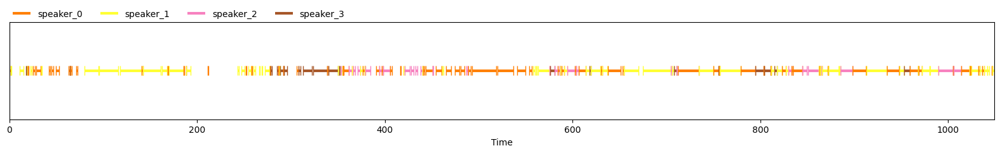

In [15]:
pred_labels = rttm_to_labels(output_dir+'/pred_rttms/ES2004a.Mix-Headset.rttm')
hypothesis = labels_to_pyannote_object(pred_labels)
hypothesis

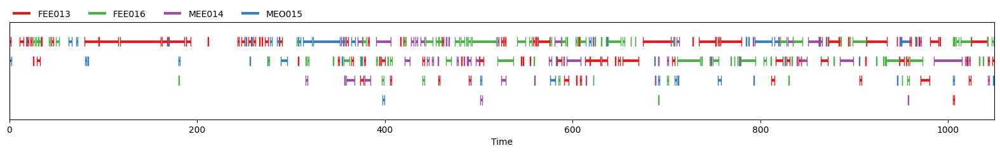

In [16]:
groundtruth

In [17]:
from pyannote.metrics.diarization import DiarizationErrorRate
metric = DiarizationErrorRate()
der = metric(groundtruth, hypothesis)
print(f'diarization error rate = {100 * der:.1f}%')

diarization error rate = 24.8%


In [18]:
exit

# VAD DIARIZATION

In this method we compute VAD time stamps using NeMo VAD model on input manifest file and then use these time stamps of speech label to find speaker embeddings followed by clustering them into num of speakers

Before we proceed let's look at the speaker diarization config, which we would be depending up on for vad computation
and speaker embedding extraction

In [14]:
print(OmegaConf.to_yaml(config))

name: ClusterDiarizer
num_workers: 4
sample_rate: 16000
batch_size: 64
diarizer:
  manifest_filepath: data/input_manifest.json
  out_dir: /tf/SD/NeMo-Nvidia/oracle_vad
  oracle_vad: true
  collar: 0.25
  ignore_overlap: true
  vad:
    model_path: null
    external_vad_manifest: null
    parameters:
      window_length_in_sec: 0.15
      shift_length_in_sec: 0.01
      smoothing: median
      overlap: 0.875
      onset: 0.4
      offset: 0.7
      pad_onset: 0.05
      pad_offset: -0.1
      min_duration_on: 0.2
      min_duration_off: 0.2
      filter_speech_first: true
  speaker_embeddings:
    model_path: titanet_large
    parameters:
      window_length_in_sec: 1.5
      shift_length_in_sec: 0.75
      multiscale_weights: null
      save_embeddings: false
  clustering:
    parameters:
      oracle_num_speakers: true
      max_num_speakers: 20
      enhanced_count_thres: 80
      max_rp_threshold: 0.25
      sparse_search_volume: 30



As can be seen most of the variables in config are self explanatory 
with VAD variables under vad section and speaker related variables under speaker embeddings section. 

To perform VAD based diarization we can ignore `oracle_vad_manifest` in `speaker_embeddings` section for now and needs to fill up the rest. We also needs to provide pretrained `model_path` of vad and speaker embeddings .nemo models

In [15]:
pretrained_vad = 'vad_marblenet'
pretrained_speaker_model = 'titanet_large'

Note in this tutorial, we use the VAD model MarbleNet-3x2 introduced and published in [ICASSP MarbleNet](https://arxiv.org/pdf/2010.13886.pdf). You might need to tune on dev set similar to your dataset if you would like to improve the performance.

And the speakerNet-M-Diarization model achieves 7.3% confusion error rate on CH109 set with oracle vad. This model is trained on voxceleb1, voxceleb2, Fisher, SwitchBoard datasets. So for more improved performance specific to your dataset, finetune speaker verification model with a devset similar to your test set.

In [16]:
output_dir = os.path.join(ROOT,'outputs')
config.diarizer.manifest_filepath = 'data/input_manifest.json'
config.diarizer.out_dir = output_dir #Directory to store intermediate files and prediction outputs

config.diarizer.speaker_embeddings.model_path = pretrained_speaker_model
config.diarizer.speaker_embeddings.parameters.window_length_in_sec = 1.5
config.diarizer.speaker_embeddings.parameters.shift_length_in_sec = 0.75
config.diarizer.oracle_vad = False # compute VAD provided with model_path to vad config
config.diarizer.clustering.parameters.oracle_num_speakers=True

#Here we use our inhouse pretrained NeMo VAD 
config.diarizer.vad.model_path = pretrained_vad
config.diarizer.vad.window_length_in_sec = 0.15
config.diarizer.vad.shift_length_in_sec = 0.01
config.diarizer.vad.parameters.onset = 0.8 
config.diarizer.vad.parameters.offset = 0.6
config.diarizer.vad.parameters.min_duration_on = 0.1
config.diarizer.vad.parameters.min_duration_off = 0.4

Now that we passed all the variables we needed lets initialize the clustering model with above config

In [17]:
from nemo.collections.asr.models import ClusteringDiarizer
sd_model = ClusteringDiarizer(cfg=config)

[NeMo I 2022-06-28 15:56:02 clustering_diarizer:129] Loading pretrained vad_marblenet model from NGC
[NeMo I 2022-06-28 15:56:02 cloud:56] Found existing object /root/.cache/torch/NeMo/NeMo_1.11.0rc0/vad_marblenet/10477085f32c378938ef41e65dc2e1b3/vad_marblenet.nemo.
[NeMo I 2022-06-28 15:56:02 cloud:62] Re-using file from: /root/.cache/torch/NeMo/NeMo_1.11.0rc0/vad_marblenet/10477085f32c378938ef41e65dc2e1b3/vad_marblenet.nemo
[NeMo I 2022-06-28 15:56:02 common:789] Instantiating model from pre-trained checkpoint


[NeMo W 2022-06-28 15:56:03 modelPT:148] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    vad_stream: false
    manifest_filepath: /home/fjia/code/manifest64/train.json
    sample_rate: 16000
    labels:
    - background
    - speech
    batch_size: 128
    num_workers: 20
    shuffle: true
    augmentor:
      shift:
        prob: 0.8
        min_shift_ms: -5.0
        max_shift_ms: 5.0
      white_noise:
        prob: 0.8
        min_level: -90
        max_level: -46
    
[NeMo W 2022-06-28 15:56:03 modelPT:155] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    vad_stream: false
    manifest_filepath: /home/fjia/code/manifest64/validation.json
    sample_r

[NeMo I 2022-06-28 15:56:03 audio_preprocessing:491] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-06-28 15:56:03 save_restore_connector:243] Model EncDecClassificationModel was successfully restored from /root/.cache/torch/NeMo/NeMo_1.11.0rc0/vad_marblenet/10477085f32c378938ef41e65dc2e1b3/vad_marblenet.nemo.
[NeMo I 2022-06-28 15:56:03 clustering_diarizer:153] Loading pretrained titanet_large model from NGC
[NeMo I 2022-06-28 15:56:03 cloud:56] Found existing object /root/.cache/torch/NeMo/NeMo_1.11.0rc0/titanet-l/492c0ab8416139171dc18c21879a9e45/titanet-l.nemo.
[NeMo I 2022-06-28 15:56:03 cloud:62] Re-using file from: /root/.cache/torch/NeMo/NeMo_1.11.0rc0/titanet-l/492c0ab8416139171dc18c21879a9e45/titanet-l.nemo
[NeMo I 2022-06-28 15:56:03 common:789] Instantiating model from pre-trained checkpoint


[NeMo W 2022-06-28 15:56:04 modelPT:148] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /manifests/combined_fisher_swbd_voxceleb12_librispeech/train.json
    sample_rate: 16000
    labels: null
    batch_size: 64
    shuffle: true
    time_length: 3
    is_tarred: false
    tarred_audio_filepaths: null
    tarred_shard_strategy: scatter
    augmentor:
      noise:
        manifest_path: /manifests/noise/rir_noise_manifest.json
        prob: 0.5
        min_snr_db: 0
        max_snr_db: 15
      speed:
        prob: 0.5
        sr: 16000
        resample_type: kaiser_fast
        min_speed_rate: 0.95
        max_speed_rate: 1.05
    num_workers: 15
    pin_memory: true
    
[NeMo W 2022-06-28 15:56:04 modelPT:155] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_valida

[NeMo I 2022-06-28 15:56:04 features:200] PADDING: 16
[NeMo I 2022-06-28 15:56:04 label_models:100] loss is Angular Softmax
[NeMo I 2022-06-28 15:56:04 audio_preprocessing:491] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-06-28 15:56:05 save_restore_connector:243] Model EncDecSpeakerLabelModel was successfully restored from /root/.cache/torch/NeMo/NeMo_1.11.0rc0/titanet-l/492c0ab8416139171dc18c21879a9e45/titanet-l.nemo.


And Diarize with single line of code

In [20]:
sd_model.diarize()

[NeMo I 2022-06-28 16:11:07 speaker_utils:82] Number of files to diarize: 1
[NeMo I 2022-06-28 16:11:07 clustering_diarizer:293] Split long audio file to avoid CUDA memory issue
[NeMo I 2022-06-28 16:11:07 vad_utils:88] The prepared manifest file exists. Overwriting!
[NeMo I 2022-06-28 16:11:08 classification_models:244] Perform streaming frame-level VAD
[NeMo I 2022-06-28 16:11:08 collections:290] Filtered duration for loading collection is 0.000000.
[NeMo I 2022-06-28 16:11:08 collections:294] # 3 files loaded accounting to # 1 labels


  0%|          | 0/3 [00:00<?, ?it/s][NeMo W 2022-06-28 16:11:17 nemo_logging:349] /usr/local/lib/python3.8/dist-packages/nemo/collections/asr/data/audio_to_label.py:172: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
      append_len_start = slice_length // 2
    
[NeMo W 2022-06-28 16:11:17 nemo_logging:349] /usr/local/lib/python3.8/dist-packages/nemo/collections/asr/data/audio_to_label.py:173: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div

RuntimeError: Caught RuntimeError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/torch/utils/data/_utils/worker.py", line 287, in _worker_loop
    data = fetcher.fetch(index)
  File "/usr/local/lib/python3.8/dist-packages/torch/utils/data/_utils/fetch.py", line 52, in fetch
    return self.collate_fn(data)
  File "/usr/local/lib/python3.8/dist-packages/nemo/collections/asr/data/audio_to_label.py", line 421, in vad_frame_seq_collate_fn
    return _vad_frame_seq_collate_fn(self, batch)
  File "/usr/local/lib/python3.8/dist-packages/nemo/collections/asr/data/audio_to_label.py", line 195, in _vad_frame_seq_collate_fn
    audio_signal = torch.stack(audio_signal)
RuntimeError: stack expects a non-empty TensorList


As can be seen, we first performed VAD, then with the timestamps created in `{output_dir}/vad_outputs` by VAD we calculated speaker embeddings (`{output_dir}/speaker_outputs/embeddings/`) which are then clustered using spectral clustering. 

To generate VAD predicted time step. We perform VAD inference to have frame level prediction &#8594; (optional: use decision smoothing) &#8594; given `threshold`,  write speech segment to RTTM-like time stamps manifest.

we use vad decision smoothing (87.5% overlap median) as described [here](https://github.com/NVIDIA/NeMo/blob/stable/nemo/collections/asr/parts/utils/vad_utils.py)

you can also tune the threshold on your dev set. Use this provided [script](https://github.com/NVIDIA/NeMo/blob/stable/scripts/voice_activity_detection/vad_tune_threshold.py)

In [ ]:
# VAD predicted time stamps
# you can also use single threshold(=onset=offset) for binarization and plot here
from nemo.collections.asr.parts.utils.vad_utils import plot
plot(
    an4_audio,
    'outputs/vad_outputs/overlap_smoothing_output_median_0.875/an4_diarize_test.median', 
    an4_rttm,
    per_args = config.diarizer.vad.parameters, #threshold
    ) 

print(f"postprocessing_params: {config.diarizer.vad.parameters}")

Predicted outputs are written to `output_dir/pred_rttms` and see how we predicted along with VAD prediction

In [ ]:
!cat outputs/pred_rttms/an4_diarize_test.rttm

In [ ]:
pred_labels = rttm_to_labels('outputs/pred_rttms/an4_diarize_test.rttm')
hypothesis = labels_to_pyannote_object(pred_labels)
hypothesis

In [ ]:
groundtruth

# Storing and Restoring models

Now we can save the whole config and model parameters in a single .nemo and restore from it anytime.

In [ ]:
oracle_model.save_to(os.path.join(output_dir,'diarize.nemo'))

Restore from saved model

In [ ]:
del oracle_model
import nemo.collections.asr as nemo_asr
restored_model = nemo_asr.models.ClusteringDiarizer.restore_from(os.path.join(output_dir,'diarize.nemo'))